In [ ]:
import h5py
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import datetime
import os
#from datetime import datetime
from datetime import timezone
from dateutil.tz import *
import matplotlib.dates as mdates
from datetime import timedelta
#from iri2016 import timeprofile, timeprofile2
from model_utils import *
from scipy import stats
from scipy.signal import medfilt2d
from julia_utils_v3 import *

In [ ]:
def GetJULIA_arrays(directory,filename):
    file_hf5 = directory + filename
    hf = h5py.File(file_hf5, 'r')
    rango = np.array(hf['Data/Table Layout/']['gdalt'])
    snl2 = np.array(hf['Data/Array Layout/2D Parameters/snl'])
    timestamps = hf['Data/Array Layout/']['timestamps']
    delta_range = np.diff(rango)[0]
    print(delta_range)
    print("Range: ",min(rango), max(rango))
    datetime_objects = np.array([datetime.datetime.fromtimestamp(ts) for ts in timestamps])
    MinRange, MaxRange = np.nanmin(rango),np.nanmax(rango)#90,838.5#646.5#1008.75#min(rango), max(rango)#90.0,1008.75 #np.min(rango), ran_max#np.max(rango)
    DataMatrixRows = int((MaxRange-MinRange)/delta_range)
    range_array = np.linspace(MinRange, MaxRange, DataMatrixRows)
    print(datetime_objects.shape, range_array.shape, snl2.shape)

    return datetime_objects, range_array, snl2

In [ ]:
year = 2024
month = 2
day = 1
str_month = GetMonth(month)
directory = 'hdf5-files-%s-%d/' % (str_month, year)
plot_format = 'png'
#filename ='jul%d%02d%02d_esf.001.hdf5' % (year,month,day)#'jro20191202a.001.hdf5'#'jro20200114b.001.hdf5'#'jro20200113a.001.hdf5'
filename ='jul%d%02d%02d_esf.hdf5' % (year,month,day)#'jro20191202a.001.hdf5'#'jro20200114b.001.hdf5'#'jro20200113a.001.hdf5'
#filename ='jul%d%02d%02d_esf.hdf5' % (year,month,day)
dt_objs1, range_array1, snr1 =  GetJULIA_arrays(directory,filename)
print("Shapes: ", dt_objs1.shape, range_array1.shape, snr1.shape)

3.0
Range:  0.0 1005.0
(7768,) (335,) (181, 7768)
Shapes:  (7768,) (335,) (181, 7768)


In [ ]:
file_hf5 = directory + filename
hf = h5py.File(file_hf5, 'r')
with h5py.File(file_hf5, 'r') as f:
    g = f.visit(print)

Data
Data/Array Layout
Data/Array Layout/1D Parameters
Data/Array Layout/1D Parameters/Data Parameters
Data/Array Layout/1D Parameters/gdlatr
Data/Array Layout/1D Parameters/gdlonr
Data/Array Layout/2D Parameters
Data/Array Layout/2D Parameters/Data Parameters
Data/Array Layout/2D Parameters/dvipn
Data/Array Layout/2D Parameters/snl
Data/Array Layout/2D Parameters/vipn
Data/Array Layout/Layout Description
Data/Array Layout/gdalt
Data/Array Layout/timestamps
Data/Table Layout
Metadata
Metadata/Data Parameters
Metadata/Experiment Notes
Metadata/Experiment Parameters
Metadata/Independent Spatial Parameters
Metadata/_record_layout


In [ ]:
file_hf5 = directory + filename
hf = h5py.File(file_hf5, 'r')
rango = np.array(hf['Data/Table Layout/']['gdalt'])
snl2 = np.array(hf['Data/Array Layout/2D Parameters/snl'])
timestamps = hf['Data/Array Layout/']['timestamps']
delta_range = np.diff(rango)[0]
print(delta_range)
print("Range: ",min(rango), max(rango))
datetime_objects = np.array([datetime.datetime.fromtimestamp(ts) for ts in timestamps])
MinRange, MaxRange = np.nanmin(rango),np.nanmax(rango)#90,838.5#646.5#1008.75#min(rango), max(rango)#90.0,1008.75 #np.min(rango), ran_max#np.max(rango)
DataMatrixRows = int((MaxRange-MinRange)/delta_range)
range_array = np.linspace(MinRange, MaxRange, DataMatrixRows)

3.0
Range:  0.0 1005.0


In [ ]:
print(datetime_objects.shape, range_array.shape, snl2.shape, rango.shape)#[-100:-1,:]

(7768,) (335,) (181, 7768) (153707,)


In [ ]:
#153707/7768#181
rango[0:100]

array([  0.,   3.,   6.,   9.,  12.,  99., 102., 105., 108., 111., 114.,
       117.,   0.,   3.,   6.,   9.,  99., 102., 105., 108., 111., 114.,
       117.,   0.,   3.,   6.,   9.,  12.,  99., 102., 105., 108., 111.,
       114., 117.,   0.,   3.,   6.,   9.,  12.,  99., 102., 105., 108.,
       111., 114., 117.,   0.,   3.,   6.,   9.,  12.,  99., 102., 105.,
       108., 111., 114., 117.,   0.,   3.,   6.,   9.,  12.,  99., 102.,
       105., 111., 114., 117., 120.,   0.,   3.,   6.,   9.,  12.,  99.,
       102., 105., 108., 111., 114., 117., 120.,   0.,   3.,   6.,   9.,
        12.,  99., 102., 105., 108., 111., 114., 117., 120.,   0.,   3.,
         6.])

(153707,)
(7768,)
(335,)
[3. 3. 3. ... 3. 3. 3.]
[datetime.timedelta(seconds=5, microseconds=990000)
 datetime.timedelta(seconds=6) datetime.timedelta(seconds=6) ...
 datetime.timedelta(seconds=6)
 datetime.timedelta(seconds=6, microseconds=10000)
 datetime.timedelta(seconds=6)]


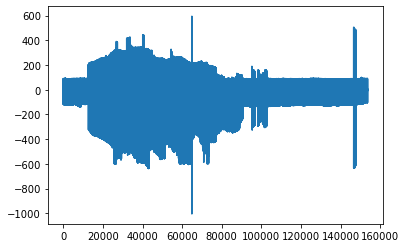

In [ ]:
print(rango.shape)
print(datetime_objects.shape)
print(range_array.shape)
print(np.diff(rango))
print(np.diff(datetime_objects))
#plt.plot(rango)
plt.plot(np.diff(rango))

In [ ]:
np.where(rango==np.max(rango))

(array([64925]),)

In [ ]:
#intFactor = 1
string_t0 = '%d-%02d-%02d %02d:00:00' % (year, month, day, 18)
dt0 = datetime.datetime.strptime(string_t0, '%Y-%m-%d %H:%M:%S')
dtf = dt0 + timedelta(hours=13)
range_ind = np.array((rango - MinRange)/delta_range,dtype=int)
#dt_indices = np.array((datetime_objects-dt0)/timedelta(seconds=60*intFactor),dtype=int)

In [ ]:
print(snl2.shape, datetime_objects.shape, range_array.shape)
print(np.max(range_ind))
#print(fils)

(181, 7768) (7768,) (335,)
335


In [ ]:
#range_ind[0:100]
zero_ind = np.array(np.where(range_ind==0)).flatten()
print(zero_ind[0],zero_ind[1],zero_ind[-1])

print(range_ind[0:zero_ind[1]])
numCols = int((1005.0-0.0)/3.0)
numFils = datetime_objects.shape[0]
print(numFils,numCols)
matAux = np.nan*np.ones((numFils,numCols))
print(snl2.shape, matAux.shape)
print(zero_ind.shape, rango.shape)

0 12 153703
[ 0  1  2  3  4 33 34 35 36 37 38 39]
7768 335
(181, 7768) (7768, 335)
(7758,) (153707,)


In [ ]:
#for i in range(numFils):
    #print(snl2[i].T.shape)
fil=2
print(snl2.T[fil])
#print(rango[0:zero_ind[1]])
print(rango[zero_ind[0]:zero_ind[1]])
print(rango[0:snl2.T[fil].shape[0]])


[4.52822869 5.43562299 4.80803565 2.53350736 0.48246781        nan
        nan        nan        nan        nan        nan        nan
        nan        nan 2.47896074 4.37132712 5.16254217 5.17510969
 5.0527825  4.43368271 2.80047046        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan       

In [ ]:
def CompleteRow(row):
    ar_list = []
    bInd = np.where(np.diff(row)>3)[0]
    if len(bInd)==0:
        ar_list.append(row)
        print("No cuts where found.")
        if row[-1]==int(MaxRange):
            print("Row already complete.")
            return row
        else:
            print("No cuts plus incomplete.")
            backup_arr = range(int(row[-1])+3,int(MaxRange)+3,3)
            print(backup_arr)
            ar_list.append(backup_arr)
            ar_ar = np.concatenate(ar_list)
            print(ar_ar)
            return ar_ar
        #print(backup_arr)

    arr1 = row[0:bInd[0]+1]
    ar_list.append(arr1)
    auxInd = bInd[0]
    count = 0
    for bind in bInd:
        missing_range = range(int(row[bind])+3,int(row[bind+1]+3),3)
        ar_list.append(missing_range)
        if bind <bInd[-1]:
            arr2 = range(int(row[bind+1]),int(row[bInd[count+1]])+3,3)[1:]
            ar_list.append(arr2)
            count+=1

    #arr3 = range(int(missing_range[-1]),int(row[-1])+3,3)[1:]
    if missing_range[-1]==row[-1]:
        arr3 = np.array([row[-1]+3],dtype=int)
    else:
        arr3 = range(int(missing_range[-1]),int(row[-1])+3,3)[1:]
    ar_list.append(arr3)
    last_arr = range(int(arr3[-1]+3),int(MaxRange)+3,3)
    ar_list.append(last_arr)
    ar_ar = np.concatenate(ar_list)

    return ar_ar


In [ ]:
row = rango[153699:153703]#np.array([ 0.,3.,6.,9.,12.,93.,96.,99.,102.,105.,108.,111.,114.,345.,348.,351.,354.,357.,360.,363.,366.,369.,423.,426.,429.,432.,435.])
new_row = CompleteRow(row)

No cuts where found.
No cuts plus incomplete.
range(12, 1008, 3)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  444.  447.  450.  453.  456.  459

In [ ]:
nrow

array([0., 3., 6., 9.])

In [ ]:
#np.diff(rango[zero_ind[1]:zero_ind[2]])
#bInd = int(np.where(np.diff(rango[zero_ind[0]:zero_ind[1]])>3)[0][0])
filNum0 = 7753#7368#7366#1180
aux00, zero_ind00 = 153699,153703#103531,103546#16859, 16881
row = rango[aux00:zero_ind00]
#row = np.array([ 0.,3.,6.,9.,12.,93.,96.,99.,102.,105.,108.,111.,114.,345.,
# 348.,351.,354.,357.,360.,363.,366.,369.,423.,426.,429.,432.,435.])
bInd = np.where(np.diff(row)>3)[0]
ar_list = []
print("Is null: ",len(bInd))
#backup_arr
if len(bInd)==0:
    ar_list.append(row)
    print("No cuts where found.")
    if row[-1]==int(MaxRange):
        print("Row already complete.")
    else:
        backup_arr = range(int(row[-1])+3,int(MaxRange)+3,3)
        ar_list.append(backup_arr)
        print(backup_arr)
print(bInd)
print(row)

arr1 = row[0:bInd[0]+1]
ar_list.append(arr1)
print("arr1: ", arr1)
print("*******************************************")
auxInd = bInd[0]
count = 0
for bind in bInd:
    print(bind)#,zero_ind[bind],aux00)
    missing_range = range(int(row[bind])+3,int(row[bind+1]+3),3)
    print("missing_range:", missing_range[0],missing_range[-1])
    ar_list.append(missing_range)
    if bind <bInd[-1]:
        arr2 = range(int(row[bind+1]),int(row[bInd[count+1]])+3,3)[1:]
        ar_list.append(arr2)
        print("arr2:", arr2[0],arr2[-1])
        count+=1

print("#######################################")
print(missing_range[-1],row[-1])
if missing_range[-1]==row[-1]:
    arr3 = np.array([row[-1]+3],dtype=int)
else:
    arr3 = range(int(missing_range[-1]),int(row[-1])+3,3)[1:]
print(arr3)
print("arr3: ", arr3[0], arr3[-1])
print("#######################################")
ar_list.append(arr3)
#if int(arr3[-1]+3)==int(MaxRange)+3:
    #last_arr = np.array([])
last_arr = range(int(arr3[-1]+3),int(MaxRange)+3,3)
ar_list.append(last_arr)
print(last_arr)
print(MaxRange)


Is null:  0
No cuts where found.
range(12, 1008, 3)
[]
[0. 3. 6. 9.]


IndexError: index 0 is out of bounds for axis 0 with size 0

In [ ]:
ar_ar = np.concatenate(ar_list)
print(ar_ar)

[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  444.  447.  450.  453.  456.  459.  462.  465.
  468.  471.  474.  477.  480.  483.  486.  489.  4

In [ ]:
for ll in ar_list:
    #print(ll)
    print(ll[0],ll[-1])

0.0 9.0
12 1005


In [ ]:
print(ar_ar.shape)
test_list = np.array(list(set(ar_ar)))
print(test_list.shape)

(336,)
(336,)


In [ ]:
(ar_ar[-1]-ar_ar[0])/3
#plt.plot(np.diff(ar_list))
#plt.plot(ar_list[0:10])

335.0

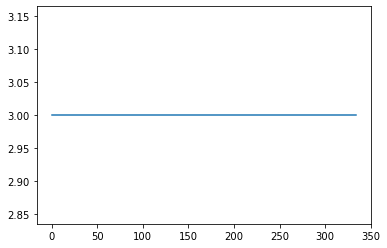

In [ ]:
#test_list = np.array(list(set(ar_list)))
#plt.plot(test_list)
plt.plot(np.diff(test_list))
#plt.xlim(0,10)

In [ ]:
#'''
bInd = np.where(np.diff(rango[zero_ind[0]:zero_ind[1]])>3)[0][0]
print(rango[zero_ind[0]:zero_ind[1]][bInd])
#print(rango[bInd+1],rango[bInd+2])
missing_range = range(int(rango[bInd]),int(rango[bInd+1]),3)
print(missing_range)
print(missing_range[0], missing_range[-1])
new_range = np.concatenate((rango[0:bInd],missing_range,rango[bInd+1:zero_ind[1]]))
print(rango[0:bInd],missing_range,rango[bInd+1:zero_ind[1]],new_range.shape)
maxInd = int((MaxRange)/3.0)
print(rango[zero_ind[1]-1],maxInd)
#'''

12.0
range(12, 99, 3)
12 96
[0. 3. 6. 9.] range(12, 99, 3) [ 99. 102. 105. 108. 111. 114. 117.] (40,)
117.0 335


In [ ]:
aux0=0
count=1
for i in range(numFils):
    print("********************")
    print("Row number: ", i)
    #print(snl2.T[i])
    #shp = snl2.T[i].shape[0]
    if count<zero_ind.shape[0]:
        print("Current indices: ", aux0,zero_ind[count])
        print(rango[aux0:zero_ind[count]])
        row = CompleteRow(rango[aux0:zero_ind[count]])
        print(row.shape)
        print(row)
        aux0=zero_ind[count]
        count+=1



********************
Row number:  0
Current indices:  0 12
[  0.   3.   6.   9.  12.  99. 102. 105. 108. 111. 114. 117.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  4

Current indices:  1119 1133
[  0.   3.   6.   9.  12.  93.  96.  99. 102. 105. 108. 114. 117. 120.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438

(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  444.  447.  450.  453.  456.  459.  462.  465.
  468.  471.  474.  477.  480.  483.  486.  

Current indices:  3437 3453
[  0.   3.   6.   9.  12.  93.  96.  99. 102. 105. 108. 111. 114. 117.
 120. 123.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.

Current indices:  4388 4403
[  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 111. 114. 117. 120.
 123.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435

[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  444.  447.  450.  453.  456.  459.  462.  465.
  468.  471.  474.  477.  480.  483.  486.  489.  4

Row number:  455
Current indices:  6260 6273
[  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 111. 114. 117.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432

Current indices:  7566 7583
[  0.   3.   6.   9.  12.  99. 102. 105. 108. 111. 114. 117. 120. 123.
 126. 129. 132.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
 

Current indices:  8622 8633
[  0.   3.   6.   9.  99. 102. 105. 108. 111. 114. 117.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  444.  

Current indices:  9549 9561
[  0.   3.   6.   9.  12.  99. 102. 105. 108. 111. 114. 117.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  4

Current indices:  10392 10404
[  0.   3.   6.   9.  96.  99. 102. 105. 108. 111. 114. 117.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441. 

Current indices:  11497 11509
[  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 111. 114.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441. 

[  0.   3.   6.   9.  12.  99. 102. 105. 108. 111. 114.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  444.  447.  450.  453.  456.  459.

Current indices:  13251 13261
[  0.   3.   6.   9.  99. 102. 105. 108. 111. 114.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  444.  447

  972.  975.  978.  981.  984.  987.  990.  993.  996.  999. 1002. 1005.]
********************
Row number:  1085
Current indices:  14669 14692
[  0.   3.   6.   9.  12.  99. 102. 105. 108. 111. 114. 330. 333. 336.
 339. 342. 345. 348. 351. 354. 357. 360. 363.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  

Current indices:  16675 16695
[  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 111. 114. 345. 348.
 351. 354. 357. 360. 363. 366.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  4

Current indices:  18225 18246
[  0.   3.   6.   9.  12.  99. 102. 105. 108. 111. 114. 360. 363. 366.
 369. 372. 375. 378. 381. 384. 387.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  42

Row number:  1292
Current indices:  19339 19361
[  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 111. 114. 366. 369.
 372. 375. 378. 381. 384. 387. 390. 393.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408

Row number:  1348
Current indices:  20685 20711
[  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 111. 366. 369. 372.
 375. 378. 381. 384. 387. 390. 393. 396. 399. 402. 405. 408.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  3

Row number:  1405
Current indices:  22185 22213
[  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 111. 378. 381. 384.
 387. 390. 393. 396. 399. 402. 405. 408. 411. 414. 417. 420. 423. 426.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.

Current indices:  24353 24376
[  0.   3.   6.   9.  12.  99. 102. 105. 108. 111. 408. 411. 414. 417.
 420. 423. 426. 429. 432. 435. 438. 441. 444.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.

  972.  975.  978.  981.  984.  987.  990.  993.  996.  999. 1002. 1005.]
********************
Row number:  1544
Current indices:  25727 25746
[  0.   3.   6.   9.  99. 102. 105. 108. 111. 114. 426. 429. 432. 435.
 438. 441. 585. 588. 591.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  36

Current indices:  27911 27946
[  0.   3.   6.   9.  99. 102. 105. 108. 111. 429. 432. 435. 438. 483.
 486. 489. 492. 495. 498. 501. 504. 507. 510. 513. 516. 519. 522. 525.
 528. 531. 534. 537. 540. 543. 546.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.

[  0.   3.   6.   9.  12.  99. 102. 105. 108. 420. 423. 426. 429. 432.
 435. 438. 441. 444. 447. 450. 453. 456. 459. 462. 465. 468. 471. 474.
 477. 480. 483. 486. 489.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  4

(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  444.  447.  450.  453.  456.  459.  462.  465.
  468.  471.  474.  477.  480.  483.  486.  

Current indices:  33073 33096
[  0.   3.   6.   9.  12. 411. 414. 417. 420. 432. 435. 438. 441. 444.
 447. 450. 453. 456. 459. 462. 465. 468. 471.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.

  972.  975.  978.  981.  984.  987.  990.  993.  996.  999. 1002. 1005.]
********************
Row number:  1854
Current indices:  35136 35182
[  0.   3.   6.   9.  12.  15. 351. 354. 357. 360. 363. 366. 369. 372.
 375. 378. 381. 384. 387. 390. 393. 396. 441. 444. 447. 450. 453. 456.
 459. 462. 465. 468. 471. 474. 477. 480. 483. 486. 489. 492. 495. 498.
 501. 504. 507. 510.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300. 

(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  444.  447.  450.  453.  456.  459.  462.  465.
  468.  471.  474.  477.  480.  483.  486.  

Current indices:  41110 41153
[  0.   3.   6.   9.  12. 114. 117. 120. 447. 450. 453. 456. 459. 462.
 465. 468. 471. 474. 477. 480. 483. 486. 489. 492. 495. 498. 501. 504.
 507. 510. 513. 540. 543. 546. 549. 552. 561. 564. 567. 570. 573. 576.
 579.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363. 

Current indices:  43577 43606
[  0.   3.   6.   9.  12. 108. 111. 114. 117. 120. 438. 441. 444. 447.
 450. 453. 456. 459. 462. 465. 468. 471. 474. 477. 480. 483. 486. 489.
 492.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399

(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  444.  447.  450.  453.  456.  459.  462.  465.
  468.  471.  474.  477.  480.  483.  486.  

(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  444.  447.  450.  453.  456.  459.  462.  465.
  468.  471.  474.  477.  480.  483.  486.  

Row number:  2260
Current indices:  51983 52004
[  0.   3.   6.   9. 108. 111. 114. 117. 354. 357. 360. 363. 366. 369.
 372. 375. 378. 381. 411. 414. 417.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  41

Current indices:  54144 54167
[  0.   3.   6.   9. 105. 108. 111. 114. 363. 366. 369. 372. 375. 411.
 414. 417. 420. 423. 444. 447. 450. 453. 456.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.

Row number:  2410
Current indices:  55933 55959
[  0.   3.   6.   9. 105. 108. 111. 114. 369. 372. 375. 378. 381. 384.
 387. 390. 393. 396. 477. 480. 483. 486. 492. 495. 498. 501.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  3

Current indices:  57642 57668
[  0.   3.   6.   9. 102. 105. 108. 111. 114. 117. 120. 375. 378. 381.
 384. 387. 390. 393. 396. 399. 426. 429. 432. 435. 438. 441.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  4

(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  444.  447.  450.  453.  456.  459.  462.  465.
  468.  471.  474.  477.  480.  483.  486.  

Row number:  2623
Current indices:  62810 62848
[  0.   3.   6.   9.  12. 102. 105. 108. 111. 114. 117. 342. 345. 348.
 351. 354. 357. 360. 363. 366. 369. 372. 375. 378. 381. 384. 411. 414.
 417. 420. 423. 426. 585. 588. 591. 594. 597. 600.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  3

[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  444.  447.  450.  453.  456.  459.  462.  465.
  468.  471.  474.  477.  480.  483.  486.  489.  4

Current indices:  67329 67353
[  0.   3.   6.   9.  12.  99. 102. 105. 108. 111. 114. 330. 333. 336.
 339. 342. 345. 348. 351. 354. 357. 360. 363. 366.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411. 

********************
Row number:  2830
Current indices:  68999 69027
[  0.   3.   6.   9.  12.  99. 102. 105. 108. 111. 114. 339. 342. 345.
 348. 351. 354. 357. 360. 363. 366. 369. 372. 375. 378. 381. 384. 387.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  3

Current indices:  71240 71285
[  0.   3.   6.   9.  99. 102. 105. 108. 111. 114. 123. 126. 129. 330.
 333. 336. 339. 342. 345. 348. 351. 354. 357. 360. 363. 366. 369. 372.
 375. 378. 381. 384. 387. 390. 393. 396. 399. 402. 486. 489. 492. 495.
 498. 501. 504.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  3

(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  444.  447.  450.  453.  456.  459.  462.  465.
  468.  471.  474.  477.  480.  483.  486.  

Current indices:  76794 76821
[  0.   3.   6.   9.  96.  99. 102. 105. 108. 111. 114. 117. 120. 123.
 297. 300. 303. 306. 309. 312. 315. 318. 321. 324. 414. 417. 420.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  40

Current indices:  79963 80000
[  0.   3.   6.   9.  99. 102. 105. 108. 111. 114. 117. 225. 228. 231.
 234. 237. 240. 243. 246. 249. 252. 255. 258. 261. 264. 267. 270. 273.
 291. 294. 297. 300. 303. 306. 309. 312. 315.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  

Current indices:  83797 83850
[  0.   3.   6.   9.  96.  99. 102. 105. 108. 111. 114. 117. 120. 123.
 126. 129. 132. 135. 210. 213. 216. 219. 222. 225. 228. 231. 234. 237.
 240. 243. 246. 249. 252. 255. 258. 261. 264. 267. 279. 282. 285. 288.
 291. 294. 297. 300. 303. 306. 309. 312. 321. 324. 327.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.

Current indices:  87018 87053
[  0.   3.   6.   9.  96.  99. 102. 105. 108. 111. 114. 117. 120. 123.
 126. 129. 132. 222. 225. 228. 231. 234. 240. 243. 246. 270. 273. 276.
 279. 282. 285. 288. 333. 336. 339.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.

(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  444.  447.  450.  453.  456.  459.  462.  465.
  468.  471.  474.  477.  480.  483.  486.  

Current indices:  91162 91179
[  0.   3.   6.   9.  96.  99. 102. 105. 108. 111. 114. 117. 120. 123.
 126. 129. 132.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.

[  0.   3.   6.   9.  96.  99. 102. 105. 108. 111. 114. 117. 120. 123.
 126.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  444.  447.  4

Current indices:  93652 93668
[  0.   3.   6.   9.  96.  99. 102. 105. 108. 111. 114. 117. 120. 123.
 126. 129.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  43

Current indices:  95015 95031
[  0.   3.   6.   9.  96.  99. 102. 105. 108. 111. 114. 117. 120. 123.
 126. 129.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  43

Current indices:  96644 96668
[  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 111. 114. 117. 120.
 123. 126. 129. 270. 273. 276. 279. 282. 285. 288.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411. 

  972.  975.  978.  981.  984.  987.  990.  993.  996.  999. 1002. 1005.]
********************
Row number:  3822
Current indices:  98139 98156
[  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 111. 114. 117. 120.
 123. 126. 129.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  

Row number:  3913
Current indices:  99811 99828
[  0.   3.   6.   9.  96.  99. 102. 105. 108. 111. 114. 117. 120. 123.
 126. 129. 132.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.

Row number:  3970
Current indices:  100843 100867
[  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 111. 114. 117. 120.
 123. 126. 129. 132. 135. 261. 264. 267. 270. 273.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402

(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  444.  447.  450.  453.  456.  459.  462.  465.
  468.  471.  474.  477.  480.  483.  486.  

  972.  975.  978.  981.  984.  987.  990.  993.  996.  999. 1002. 1005.]
********************
Row number:  4133
Current indices:  104117 104135
[  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 111. 114. 117. 120.
 123. 126. 129. 132.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369. 

Current indices:  105651 105669
[  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 111. 114. 117. 120.
 123. 126. 129. 132.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426

Current indices:  106858 106874
[  0.   3.   6.   9.  96.  99. 102. 105. 108. 111. 114. 117. 120. 123.
 126. 129.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  

Current indices:  108163 108180
[  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 111. 114. 117. 120.
 123. 126. 129.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  42

Row number:  4444
Current indices:  109329 109345
[  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 111. 114. 117. 120.
 123. 126.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  4

  972.  975.  978.  981.  984.  987.  990.  993.  996.  999. 1002. 1005.]
********************
Row number:  4513
Current indices:  110408 110423
[  0.   3.   6.   9.  96.  99. 102. 105. 108. 111. 114. 117. 120. 123.
 126.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  37

(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  444.  447.  450.  453.  456.  459.  462.  465.
  468.  471.  474.  477.  480.  483.  486.  

[  0.   3.   6.   9.  96.  99. 102. 105. 108. 114. 117. 120. 123. 126.
 129.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  444.  447.  4

Row number:  4768
Current indices:  114386 114403
[  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 111. 114. 117. 120.
 123. 126. 129.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  42

Current indices:  115493 115507
[  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 114. 117. 120. 123.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435. 

Current indices:  116964 116980
[  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 111. 114. 117. 120.
 123. 126.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  

Current indices:  118319 118336
[  0.   3.   6.   9.  12.  93.  96.  99. 102. 105. 108. 111. 114. 117.
 120. 123. 126.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  42

Current indices:  119603 119618
[  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 111. 114. 117. 120.
 123.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432. 

Row number:  5165
Current indices:  120504 120519
[  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 111. 114. 117. 120.
 123.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  

(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  444.  447.  450.  453.  456.  459.  462.  465.
  468.  471.  474.  477.  480.  483.  486.  

Current indices:  123540 123555
[  0.   3.   6.   9.  96.  99. 102. 105. 108. 111. 114. 117. 120. 123.
 126.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432. 

[  0.   3.   6.   9.  12.  15.  96.  99. 102. 105. 108. 111. 114. 117.
 120. 123. 126.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  444

Current indices:  125501 125515
[  0.   3.   6.   9.  12.  99. 102. 105. 108. 111. 114. 117. 120. 123.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435. 

Row number:  5558
Current indices:  126353 126366
[  0.   3.   6.   9.  99. 102. 105. 108. 111. 114. 117. 120. 123.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.


Row number:  5622
Current indices:  127213 127226
[  0.   3.   6.   9.  12.  99. 102. 105. 108. 111. 114. 117. 120.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.


[  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 111. 114. 117. 120.
 123.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  444.  447.  4

[  0.   3.   6.   9.  96.  99. 102. 105. 108. 111. 114. 117. 120. 123.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  444.  447.  450.  4

Current indices:  130466 130481
[  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 111. 114. 117. 120.
 123.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432. 

Current indices:  131661 131677
[  0.   3.   6.   9.  96.  99. 102. 105. 108. 111. 114. 117. 120. 123.
 126. 129.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  

[  0.   3.   6.   9.  93.  96.  99. 102. 105. 108. 111. 114. 117. 120.
 123. 126. 129.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  444

Row number:  6091
Current indices:  134147 134163
[  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 111. 114. 117. 120.
 123. 126.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  4

Current indices:  135404 135419
[  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 111. 114. 117. 120.
 123.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432. 

Row number:  6236
Current indices:  136388 136403
[  0.   3.   6.   9.  96.  99. 102. 105. 108. 111. 114. 117. 120. 123.
 126.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  

Row number:  6283
Current indices:  137096 137110
[  0.   3.   6.   9.  93.  96.  99. 102. 105. 108. 111. 114. 117. 120.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  

Row number:  6355
Current indices:  138244 138260
[  0.   3.   6.   9.  93.  96.  99. 102. 105. 108. 111. 114. 117. 120.
 123. 126.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  4

(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  444.  447.  450.  453.  456.  459.  462.  465.
  468.  471.  474.  477.  480.  483.  486.  

  972.  975.  978.  981.  984.  987.  990.  993.  996.  999. 1002. 1005.]
********************
Row number:  6523
Current indices:  140901 140916
[  0.   3.   6.   9.  93.  96.  99. 102. 105. 108. 111. 114. 117. 120.
 123.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  37

Current indices:  142202 142217
[  0.   3.   6.   9.  93.  96.  99. 102. 105. 108. 111. 114. 117. 120.
 123.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432. 

Row number:  6682
Current indices:  143314 143329
[  0.   3.   6.   9.  93.  96.  99. 102. 105. 108. 111. 114. 117. 120.
 123.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  

Current indices:  144547 144562
[  0.   3.   6.   9.  93.  96.  99. 102. 105. 108. 111. 114. 117. 120.
 123.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432. 

Current indices:  145581 145596
[  0.   3.   6.   9.  93.  96.  99. 102. 105. 108. 111. 114. 117. 120.
 123.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432. 

Row number:  6900
Current indices:  146455 146468
[  0.   3.   6.   9.  96.  99. 102. 105. 108. 111. 114. 117. 120.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.


********************
Row number:  6976
Current indices:  147569 147582
[  0.   3.   6.   9.  96.  99. 102. 105. 108. 111. 114. 117. 120.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  42

Row number:  7067
Current indices:  148759 148771
[  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 111. 114.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432

Current indices:  149775 149789
[  0.   3.   6.   9.  12.  93.  96.  99. 102. 105. 108. 111. 114. 117.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435. 

Current indices:  150708 150717
[  0.   3.   6.   9.  12. 105. 108. 111. 114.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  444.  447.  

  972.  975.  978.  981.  984.  987.  990.  993.  996.  999. 1002. 1005.]
********************
Row number:  7320
Current indices:  151519 151528
[  0.   3.   6.   9.  99. 102. 105. 108. 111.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393

Current indices:  152256 152263
[  0.   3.   6.   9.  99. 102. 105.]
(336,)
[   0.    3.    6.    9.   12.   15.   18.   21.   24.   27.   30.   33.
   36.   39.   42.   45.   48.   51.   54.   57.   60.   63.   66.   69.
   72.   75.   78.   81.   84.   87.   90.   93.   96.   99.  102.  105.
  108.  111.  114.  117.  120.  123.  126.  129.  132.  135.  138.  141.
  144.  147.  150.  153.  156.  159.  162.  165.  168.  171.  174.  177.
  180.  183.  186.  189.  192.  195.  198.  201.  204.  207.  210.  213.
  216.  219.  222.  225.  228.  231.  234.  237.  240.  243.  246.  249.
  252.  255.  258.  261.  264.  267.  270.  273.  276.  279.  282.  285.
  288.  291.  294.  297.  300.  303.  306.  309.  312.  315.  318.  321.
  324.  327.  330.  333.  336.  339.  342.  345.  348.  351.  354.  357.
  360.  363.  366.  369.  372.  375.  378.  381.  384.  387.  390.  393.
  396.  399.  402.  405.  408.  411.  414.  417.  420.  423.  426.  429.
  432.  435.  438.  441.  444.  447.  450.  453.

Current indices:  153315 153319
[0. 3. 6. 9.]
(4,)
[0. 3. 6. 9.]
********************
Row number:  7665
Current indices:  153319 153323
[0. 3. 6. 9.]
(4,)
[0. 3. 6. 9.]
********************
Row number:  7666
Current indices:  153323 153327
[0. 3. 6. 9.]
(4,)
[0. 3. 6. 9.]
********************
Row number:  7667
Current indices:  153327 153331
[0. 3. 6. 9.]
(4,)
[0. 3. 6. 9.]
********************
Row number:  7668
Current indices:  153331 153335
[0. 3. 6. 9.]
(4,)
[0. 3. 6. 9.]
********************
Row number:  7669
Current indices:  153335 153339
[0. 3. 6. 9.]
(4,)
[0. 3. 6. 9.]
********************
Row number:  7670
Current indices:  153339 153343
[0. 3. 6. 9.]
(4,)
[0. 3. 6. 9.]
********************
Row number:  7671
Current indices:  153343 153347
[0. 3. 6. 9.]
(4,)
[0. 3. 6. 9.]
********************
Row number:  7672
Current indices:  153347 153352
[ 0.  3.  6.  9. 12.]
(5,)
[ 0.  3.  6.  9. 12.]
********************
Row number:  7673
Current indices:  153352 153356
[0. 3. 6. 9.]
(4

In [ ]:
aux0 = 0
count = 1
for i in range(numFils):
    #print(matAux[i])
    #print(snl2.T[i])
    #for j in range(numCols):
    #row = matAux[i]
    #matAux[i,range_ind[aux0:zero_ind[count]]]
    #print(i,range_ind[aux0:zero_ind[count]])
    if count<zero_ind.shape[0]:
        #print(snl2.T[i,range_ind[aux0]:zero_ind[count]])
        #matAux[i,aux0:zero_ind[count]] = snl2[i,aux0:zero_ind[count]]
        #print(matAux[i,aux0:zero_ind[count]])
        print("********************")
        print(i,aux0,zero_ind[count])
        #print(snl2.T[i,aux0:zero_ind[count]])
        inds = np.array((rango[aux0:zero_ind[count]] - 0.0)/3,dtype=int)
        print(inds)
        print(i,rango[aux0:zero_ind[count]])
        print(snl2.T[i,inds])
        #matAux[i,inds] = snl2.T[i]
        #print(snl2.T[i].shape)
        #print(i, aux0,zero_ind[count])
    #print(snl2.T[i])
        aux0 = zero_ind[count]
        count+=1

********************
0 0 12
[ 0  1  2  3  4 33 34 35 36 37 38 39]
0 [  0.   3.   6.   9.  12.  99. 102. 105. 108. 111. 114. 117.]
[ 3.93249333  5.25413962  5.02532486  1.4052818  -0.29385582         nan
         nan         nan         nan         nan         nan         nan]
********************
1 12 23
[ 0  1  2  3 33 34 35 36 37 38 39]
1 [  0.   3.   6.   9.  99. 102. 105. 108. 111. 114. 117.]
[5.9466759  6.79639409 6.15289563 4.2926736         nan        nan
        nan        nan        nan        nan        nan]
********************
2 23 35
[ 0  1  2  3  4 33 34 35 36 37 38 39]
2 [  0.   3.   6.   9.  12.  99. 102. 105. 108. 111. 114. 117.]
[4.52822869 5.43562299 4.80803565 2.53350736 0.48246781        nan
        nan        nan        nan        nan        nan        nan]
********************
3 35 47
[ 0  1  2  3  4 33 34 35 36 37 38 39]
3 [  0.   3.   6.   9.  12.  99. 102. 105. 108. 111. 114. 117.]
[6.10582947 6.89833161 6.14389659 4.3500774  2.37656987        nan
        nan 

[ 0  1  2  3  4 31 32 33 34 35 36 37 38 39 40]
234 [  0.   3.   6.   9.  12.  93.  96.  99. 102. 105. 108. 111. 114. 117.
 120.]
[5.0903714  5.16496191 4.41777807 2.56533972 0.58208849        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan]
********************
235 3286 3301
[ 0  1  2  3  4 31 32 33 34 35 36 37 38 39 40]
235 [  0.   3.   6.   9.  12.  93.  96.  99. 102. 105. 108. 111. 114. 117.
 120.]
[4.4112047  5.12974986 4.18188318 2.45881386 0.5206848         nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan]
********************
236 3301 3316
[ 0  1  2  3  4 32 33 34 35 36 37 38 39 40 41]
236 [  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 111. 114. 117. 120.
 123.]
[4.32564875 5.14892727 4.14783031 2.66164709 0.64726661        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan]
********************
237 3316 3330
[

409 5688 5700
[ 0  1  2  3 32 33 34 35 36 37 38 39]
409 [  0.   3.   6.   9.  96.  99. 102. 105. 108. 111. 114. 117.]
[5.72403351 6.27851747 5.64976799 4.25580979        nan        nan
        nan        nan        nan        nan        nan        nan]
********************
410 5700 5713
[ 0  1  2  3  4 32 33 34 35 36 37 38 39]
410 [  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 111. 114. 117.]
[5.0555616  5.82225506 4.99937942 3.75083159 1.17801065        nan
        nan        nan        nan        nan        nan        nan
        nan]
********************
411 5713 5725
[ 0  1  2  3 32 33 34 35 36 37 38 39]
411 [  0.   3.   6.   9.  96.  99. 102. 105. 108. 111. 114. 117.]
[5.22140056 5.73596442 5.07233079 3.79369683        nan        nan
        nan        nan        nan        nan        nan        nan]
********************
412 5725 5737
[ 0  1  2  3 32 33 34 35 36 37 38 39]
412 [  0.   3.   6.   9.  96.  99. 102. 105. 108. 111. 114. 117.]
[4.5907562  5.23585703 4.49713202 3.1286

608 8537 8548
[ 0  1  2  3 33 34 35 36 37 38 39]
608 [  0.   3.   6.   9.  99. 102. 105. 108. 111. 114. 117.]
[4.59737163 5.24002586 4.46114522 2.85884877        nan        nan
        nan        nan        nan        nan        nan]
********************
609 8548 8560
[ 0  1  2  3  4 33 34 35 36 37 38 39]
609 [  0.   3.   6.   9.  12.  99. 102. 105. 108. 111. 114. 117.]
[4.55767953 5.20291738 4.4119504  2.9894262  0.4090368         nan
        nan        nan        nan        nan        nan        nan]
********************
610 8560 8573
[ 0  1  2  3 33 34 35 37 38 39 44 45 46]
610 [  0.   3.   6.   9.  99. 102. 105. 111. 114. 117. 132. 135. 138.]
[4.54064846 5.18119808 4.3742708  2.71100495        nan        nan
        nan        nan        nan        nan        nan        nan
        nan]
********************
611 8573 8585
[ 0  1  2  3  4 33 34 35 36 37 38 39]
611 [  0.   3.   6.   9.  12.  99. 102. 105. 108. 111. 114. 117.]
[4.56868008 5.18023549 4.30433238 3.03558792 0.46777427    

        nan        nan        nan        nan        nan]
********************
800 10751 10763
[ 0  1  2  3  4 33 34 35 36 37 38 39]
800 [  0.   3.   6.   9.  12.  99. 102. 105. 108. 111. 114. 117.]
[4.94525303 5.74097348 4.87739093 3.19510242 1.21500546        nan
        nan        nan        nan        nan        nan        nan]
********************
801 10763 10775
[ 0  1  2  3  4 33 34 35 36 37 38 39]
801 [  0.   3.   6.   9.  12.  99. 102. 105. 108. 111. 114. 117.]
[5.16279718 5.71548951 4.80237388 2.88533032 1.16824347        nan
        nan        nan        nan        nan        nan        nan]
********************
802 10775 10786
[ 0  1  2  3 33 34 35 36 37 38 39]
802 [  0.   3.   6.   9.  99. 102. 105. 108. 111. 114. 117.]
[5.75204751 6.36800985 5.75256341 3.8461478         nan        nan
        nan        nan        nan        nan        nan]
********************
803 10786 10797
[ 0  1  2  3  4 33 34 35 36 37 38]
803 [  0.   3.   6.   9.  12.  99. 102. 105. 108. 111. 114.]
[

1000 [  0.   3.   6.   9.  99. 102. 105. 108. 111. 114.]
[4.56343298 5.18437412 4.28135157 2.53387962        nan        nan
        nan        nan        nan        nan]
********************
1001 13173 13184
[ 0  1  2  3 33 34 35 36 37 38 39]
1001 [  0.   3.   6.   9.  99. 102. 105. 108. 111. 114. 117.]
[4.54141675 5.208019   4.45207909 2.58349783        nan        nan
        nan        nan        nan        nan        nan]
********************
1002 13184 13197
[ 0  1  2  3  4 31 32 33 34 35 36 37 38]
1002 [  0.   3.   6.   9.  12.  93.  96.  99. 102. 105. 108. 111. 114.]
[4.52676292 5.16415906 4.28273295 2.44859693 0.37215065        nan
        nan        nan        nan        nan        nan        nan
        nan]
********************
1003 13197 13207
[ 0  1  2  3 33 34 35 36 37 38]
1003 [  0.   3.   6.   9.  99. 102. 105. 108. 111. 114.]
[4.54868959 5.17668916 4.33548874 2.59876245        nan        nan
        nan        nan        nan        nan]
********************
1004 13207 1

[4.03867311 4.91193036 3.61922599 1.76828876 0.54517191        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan]
********************
1169 16636 16656
[  0   1   2   3  31  32  33  34  35  36  37  38 115 116 117 118 119 120
 121 122]
1169 [  0.   3.   6.   9.  93.  96.  99. 102. 105. 108. 111. 114. 345. 348.
 351. 354. 357. 360. 363. 366.]
[4.43037886 5.08473243 4.09973432 2.41525275        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan]
********************
1170 16656 16675
[  0   1   2   3   4  33  34  35  36  37  38 115 116 117 118 119 120 121
 122]
1170 [  0.   3.   6.   9.  12.  99. 102. 105. 108. 111. 114. 345. 348. 351.
 354. 357. 360. 363. 366.]
[4.19713764 4.97401388 3.61840334 1.83751223 0.41127554        nan
        nan        nan 

********************
1344 20574 20602
[  0   1   2   3   4  31  32  33  34  35  36  37  38 122 123 124 125 126
 127 128 129 130 131 132 133 134 135 136]
1344 [  0.   3.   6.   9.  12.  93.  96.  99. 102. 105. 108. 111. 114. 366.
 369. 372. 375. 378. 381. 384. 387. 390. 393. 396. 399. 402. 405. 408.]
[4.61554638 5.27220215 4.42176202 2.67515027 0.31259599        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan]
********************
1345 20602 20629
[  0   1   2   3   4  32  33  34  35  36  37  38 122 123 124 125 126 127
 128 129 130 131 132 133 134 135 136]
1345 [  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 111. 114. 366. 369.
 372. 375. 378. 381. 384. 387. 390. 393. 396. 399. 402. 405. 408.]
[4.59464287 5.15681805 4.45162651 2.64907367 0.44127754        nan
        nan        nan    

1510 25022 25048
[  0   1   2   3   4  32  33  34  35  36  37  38 136 137 138 139 140 141
 142 143 144 145 146 147 148 149]
1510 [  0.   3.   6.   9.  12.  96.  99. 102. 105. 108. 111. 114. 408. 411.
 414. 417. 420. 423. 426. 429. 432. 435. 438. 441. 444. 447.]
[4.56362435 5.10566405 4.19594242 2.35500606 0.58011207        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan]
********************
1511 25048 25074
[  0   1   2   3   4   5  33  34  35  36  37  38 136 137 138 139 140 141
 142 143 144 145 146 147 148 149]
1511 [  0.   3.   6.   9.  12.  15.  99. 102. 105. 108. 111. 114. 408. 411.
 414. 417. 420. 423. 426. 429. 432. 435. 438. 441. 444. 447.]
[ 4.49718908  5.10072509  4.23153467  2.48227727  0.51537862 -0.09571526
         nan         nan         nan         nan         nan         nan
         nan     

IndexError: index 196 is out of bounds for axis 1 with size 181

In [ ]:
#matAux
#snl2.T[15,186:199]
print(snl2.T[14].
      0+shape)
snl2.T[15]#.shape

(181,)


array([4.55593954, 5.19767926, 4.30524017, 2.30095569, 0.21519584,
              nan,        nan,        nan,        nan,        nan,
              nan,        nan,        nan,        nan, 2.03475751,
       4.21145075, 5.02806646, 5.1439902 , 4.77933428, 4.1785069 ,
       3.20334682, 0.15706521,        nan,        nan,        nan,
              nan,        nan,        nan,        nan,        nan,
              nan,        nan,        nan,        nan,        nan,
              nan,        nan,        nan,        nan,        nan,
              nan,        nan,        nan,        nan,        nan,
              nan,        nan,        nan,        nan,        nan,
              nan,        nan,        nan,        nan,        nan,
              nan,        nan,        nan,        nan,        nan,
              nan,        nan,        nan,        nan,        nan,
              nan,        nan,        nan,        nan,        nan,
              nan,        nan,        nan,        nan,        

In [ ]:
fils, cols = snl2.T.shape
print(fils,cols)

In [ ]:

snr_temp = np.nan*np.ones((465,len(datetime_objects)))
aux0 = 0
count = 1
for i in range(fils):
    #print(rango[aux0:zero_ind[count]])
    snr_temp[i,range_ind[aux0:zero_ind[count]]] = snl2[i,range_ind[aux0:zero_ind[count]]]
    #print("Temp.: ",i, snr_temp.T[i,range_ind[aux0:zero_ind[count]]].shape)
    #print("Data: ",i, snl2.T[i,range_ind[aux0:zero_ind[count]]].shape)
    print(snl2[i,range_ind[aux0:zero_ind[count]]])
    aux0 = zero_ind[count]
    if count < zero_ind.shape[0]-1:
        count+=1
    else:
        break
    #print(snl2.T[i].shape)

In [ ]:
#plt.plot(range_ind)
print(datetime_objects.shape,range_array.shape,snr_temp.shape)


In [ ]:
fontsize = 20
fig, ax = plt.subplots(figsize=(18,6))
clrs= ax.pcolormesh(datetime_objects, range_array, matAux.T, cmap='jet')
ax.xaxis_date()
date_format = mdates.DateFormatter('%H:%M')
ax.xaxis.set_major_formatter(date_format)
ax.set_xlabel("Hora Local (h)", fontsize=fontsize)
ax.set_ylabel("Rango (km)", fontsize=fontsize)

ax.xaxis.set_tick_params(labelsize=fontsize)
ax.yaxis.set_tick_params(labelsize=fontsize)
ax.set_title('ESF - JULIA (%d-%02d-%02d)' % (year,month,day), fontsize=fontsize+2)
fig.autofmt_xdate()
box=ax.get_position()
cbarax=fig.add_axes([box.x0+box.width+0.01, box.y0, 0.025, box.height])
cb=plt.colorbar(clrs,cax=cbarax)
    #cb2 = fig.colorbar(im2)
cb.set_label(r'SNR (dB)', fontsize=fontsize)
cb.ax.tick_params(labelsize=fontsize)
#cb.mappable.set_clim(-2,4)
#plot_format = 'pdf'
#tr_fig = '%s/filtrado-nuevo-mapa-de-ocurrencias-ESF-%d-%s-%s.%s' % (plots_boletin,year, GetMonth(month),color_palette,plot_format)
plt.setp( ax.xaxis.get_majorticklabels(), rotation=0 ,ha='center')

In [ ]:
def GetArrays_test(directory, filename, PlotFlag):
    hour_i= 18.0
    hour_f = 7.0
    h_min = 0.0#90.0
    h_max = 1395.0#1008.75
    delta_ran = 3.0 # 1.5

    file_hf5 = directory + filename
    hf = h5py.File(file_hf5, 'r')
    rango = hf['Data/Table Layout/']['gdalt']
    snl =  hf['Data/Table Layout/']['snl']
    snl2 = hf['Data/Array Layout/2D Parameters/snl']
    #vipe1 = hf['Data/Array Layout/2D Parameters/vipe']
    #vipn1 = hf['Data/Array Layout/2D Parameters/vipn']
    #vipe1 = hf['Data/Array Layout/2D Parameters/vipe']
    #if  hf['Data/Array Layout/2D Parameters/vipn1']:
    #    vipn1 = hf['Data/Array Layout/2D Parameters/vipn1']
    #else:
    vipn1 = hf['Data/Array Layout/2D Parameters']['vipn']

    timestamps = hf['Data/Array Layout/']['timestamps']
    vvert = np.array(vipn1).flatten()#hf['Data Layout/']['vipn1']
    time_vector = []
    #v_zonal = np.array(vipe1).T
    v_vertical = np.array(vipn1).T
    snl2 = np.array(snl2).T
    #################################
    prev_stamps = []

    datetime_objects = []
    for ts in timestamps:
        if ts in prev_stamps:
            print('Same timestap')
        else:
            date_time_obj = datetime.datetime.fromtimestamp(ts)
            datetime_objects.append(date_time_obj)
    new_index = pd.DatetimeIndex(datetime_objects) # timedelta(hours=5)
    index = pd.DatetimeIndex(datetime_objects) # timedelta(hours=5)
    datetime_objects = np.array(datetime_objects)#,dtype='datetime64[s]')
    day = index[0].day
    anio = index[0].year
    year = index[0].year
    month = index[0].month
    month_prime = month
    dia = day
    mes = GetMonth(month)#GetMonth(month)
    ###########################################################
    string_tlim = '%d-%02d-%02d %02d:00:00' % (year, month, day, 23)
    dt_lim = datetime.datetime.strptime(string_tlim, '%Y-%m-%d %H:%M:%S') + timedelta(hours=8)
    print(dt_lim)
    i=0
    inds = []
    for t in datetime_objects:
        if t>=dt_lim:
            print("Timestamp mayor a 7 AM: ", t, ". Índice: ", i)
            inds.append(i)
        i=i+1
    print(datetime_objects.shape, v_vertical.shape)
    print(inds) #falta sumar 1 al restringir los arreglos.
    if len(inds)>0:
        print("Reajustando v_vertical y datetime_objects")
        v_vertical = v_vertical[:inds[0],:]
        datetime_objects = datetime_objects[:inds[0]]
        print(v_vertical.shape, datetime_objects.shape)
    ###########################################################

    ran_max = np.max(rango)
    ran_min = np.min(rango)
    rango = np.array(rango)
    range_diff = np.diff(rango)
    mode = stats.mode(range_diff)
    print('delta_range', mode[0])
    delta_range = mode[0]
    MinRange, MaxRange = h_min,h_max#min(rango), max(rango)#90.0,1008.75 #np.min(rango), ran_max#np.max(rango)
    DataMatrixRows = int((MaxRange-MinRange)/delta_range+1)
#range_array = np.linspace(MinRange, MaxRange, DataMatrixRows+1)
    DataMatrix = np.ones((DataMatrixRows, datetime_objects.shape[0]))*np.nan
    DataMatrixVert = np.ones((DataMatrixRows, datetime_objects.shape[0]))*np.nan
    DriftMatrix = np.ones((DataMatrixRows, datetime_objects.shape[0]))*np.nan
    RowInMatrix = np.array((rango-MinRange)/delta_range, dtype=int)
    range_array = np.linspace(MinRange, MaxRange, DataMatrixRows)
    RangeMatrix = np.ones((DataMatrixRows, datetime_objects.shape[0]))*np.nan

    time_range, range_fixed = GetTimeRangeArrays(year, month, day, hour_i, hour_f,h_min,h_max,delta_range)

    dir_plots = 'Plots-%s-%d' % (mes, anio)
    dir_plots_EEJ = 'Plots-%s-%d/EEJ' % (mes, anio)
    if month==13:
        dir_plots = 'Plots-Noviembre-Diciembre-%d' % anio
        dir_plots_EEJ = 'Plots-Noviembre-Diciembre-%d/EEJ' % anio
    col = 0 #counter for current columns
    PastRow = 0 #saving past row index

    data = np.array(snl2)#DataMatrix.T#[::-1]
    string_t0 = '%d-%02d-%02d %02d:00:00' % (year, month, day, 18)
    dt0 = datetime.datetime.strptime(string_t0, '%Y-%m-%d %H:%M:%S')
    dt_indices = np.array((datetime_objects-dt0)/timedelta(seconds=600),dtype=int)
    print("Datetime_objs: ",datetime_objects )
    print("dt0: ", dt0)
    print(dt_indices)
    #print(rango2D.shape, snl2.shape, data.shape, datetime_objects.shape)
    m = np.r_[True,dt_indices[:-1]!=dt_indices[1:],True]
    counts = np.diff(np.flatnonzero(m))
    unq = dt_indices[m[:-1]]
    times_repeated=np.c_[unq,counts]
    #time_Range_index = np.linspace(0,78,77)
    time_range_index = np.arange(0,78)
    #print(time_range_index)
    #range_fixed = np.array(hf['Data/Array Layout/']['gdalt'])
    ###############################################################################
    #d_prom = np.zeros((times_repeated.shape[0], data.shape[1]))
    d_prom = np.zeros((times_repeated.shape[0], range_fixed.shape[0]))
    v_prom = np.zeros((times_repeated.shape[0], range_fixed.shape[0]))
    print("d_prom: ", d_prom.shape)
    for j in range(data.shape[1]):

        for i in range(times_repeated.shape[0]):
            if i==0:
                d_prom[i,j] = np.nanmean(data[0:times_repeated[0,1],j])
            else:
                aux = np.sum(times_repeated[0:i,1])
                aux2 = times_repeated[i,1]
                d_prom[i,j] = np.nanmean(data[aux:aux+aux2,j])
    #'''
    index_aux = times_repeated[:,0]
    diff = Diff(time_range_index, index_aux)
    diff=np.array(diff)
    diff=np.sort(diff)
    diff=diff.astype(np.dtype('int64'))
    b3=np.ones((time_range_index.shape[0],range_fixed.shape[0]))*np.nan

    for j in range(data.shape[1]):
        b_aux=d_prom[:,j]
        for i in list(diff):
            aux=b_aux[:i]
            #aux2=b_aux[i:]
            aux=np.append(aux,np.nan)
            aux=np.append(aux,b_aux[i:])
            b_aux=aux
        b3[:,j]=b_aux

    #'''
    rango = np.array(hf['Data/Array Layout/']['gdalt'])
    #range_fixed = rango.copy()
        #######################################################################################################
    if (PlotFlag):
        fig, ax = plt.subplots(figsize=(18, 6))
        x_min = mdates.date2num(np.min(index))
        x_max = mdates.date2num(np.max(index))
        extent=[x_min, x_max,ran_min,ran_max]
        #im2 = plt.imshow(data, cmap='jet',aspect='auto',interpolation='nearest',origin="lower", extent=extent)
        print("Shapes before printing:", datetime_objects.shape, range_array.shape, data.T.shape)
        print("Standard shaped: ", time_range.shape, range_fixed.shape, b3.shape)
        #clrs= ax.pcolormesh(mdates.date2num(datetime_objects), range_array, data.T, cmap='jet')
        clrs= ax.pcolormesh(mdates.date2num(time_range), range_fixed, medfilt2d(b3).T, cmap='jet')
        ax.xaxis_date()
        date_format = mdates.DateFormatter('%H:%M')
        ax.xaxis.set_major_formatter(date_format)
        ax.set_xlabel("Hora Local (h)", fontsize=18)
        ax.set_ylabel("Rango (km)", fontsize=18)
        ax.set_ylim(range_fixed[0],800)
        ax.xaxis.set_tick_params(labelsize=18)
        ax.yaxis.set_tick_params(labelsize=18)
        fig_title = r'F-Dispersa JULIA(%d-%02d-%02d)' % (anio, month_prime, dia)
        plt.title(fig_title, fontsize=20)
        # This simply sets the x-axis data to diagonal so it fits better.
        fig.autofmt_xdate()
        box=ax.get_position()
        cbarax=fig.add_axes([box.x0+box.width+0.01, box.y0, 0.025, box.height])
        cb=plt.colorbar(clrs,cax=cbarax)
        #cb2 = fig.colorbar(im2)
        cb.set_label(r'$SNR (dB)$', fontsize=18)
        cb.ax.tick_params(labelsize=17)
        plt.setp( ax.xaxis.get_majorticklabels(), rotation=0 ,ha='center')
        #plt.savefig(r'ESF-no-labels-%d-%02d-%02d.png' % (year[0], month[0], days[0]))
        plt.savefig(r'%s/ESF-prueba-escalado-%d-%02d-%02d.png' % (dir_plots,anio, month_prime, dia),bbox_inches='tight')
        plt.show()
        plt.close(fig)


    return time_range, range_fixed, b3,data,snl, snl2, index, range_array, rango, dir_plots, np.array(datetime_objects)#, dataVert
    ################################################################################


In [ ]:
year = 2024
month = 1
day = 1
str_month = GetMonth(month)
plots_boletin = '/home/jp/Desktop-ROJ/Plots-Boletines/%02d/%s' % (year,str_month)
directory = 'hdf5-files-%s-%d/' % (str_month, year)
plot_format = 'pdf'
dir_plots = 'Plots-%s-%d' % (str_month,year)
dir_plots_EEJ = 'Plots-%s-%d/EEJ' % (str_month,year)
#filename ='jul%d%02d%02d_esf.001.hdf5' % (year,month,day)#'jro20191202a.001.hdf5'#'jro20200114b.001.hdf5'#'jro20200113a.001.hdf5'
filename ='jul%d%02d%02d_esf.hdf5' % (year,month,day)#'jul%d%02d%02d_esf.hdf5' % (year,month,day)#'jro20191202a.001.hdf5'#'jro20200114b.001.hdf5'#'jro20200113a.001.hdf5'
#filename ='jul%d%02d%02d_esf.hdf5' % (year,month,day)#'jro20191202a.001.hdf5'#'jro20200114b.001.hdf5'#'jro20200113a.001.hdf5'

print(filename)
print('dir_plots = ', dir_plots)
#"jul20210903_esf.hdf5"

In [ ]:
for filename2 in sorted(os.listdir(directory)):
    if filename2.endswith(".hdf5"):
        print('========================================================')
        print(filename2)
        file_hf5 = directory + filename2
        hf = h5py.File(file_hf5, 'r')
        timestamps = hf['Data/Array Layout/']['timestamps']
#v_aux = hf['Data/Array Layout/2D Parameters']['vipn1']
        v_aux = hf['Data/Array Layout/2D Parameters/vipn']
        snr = np.array(hf['Data/Array Layout/2D Parameters/snl'])
        rango = np.array(hf['Data/Array Layout/']['gdalt'])
    #################################
        datetime_objects = []
        prev_stamps = []
        for ts in timestamps:
            if ts in prev_stamps:
                print('Same timestap')
            else:
                date_time_obj = datetime.datetime.fromtimestamp(ts)
                datetime_objects.append(date_time_obj)
        datetime_objects = np.array(datetime_objects)#,dtype='datetime64[s]')
        print(datetime_objects[0],datetime_objects[-1], np.diff(datetime_objects)[0],np.diff(datetime_objects)[1])
        print(datetime_objects.shape, rango.shape, snr.shape)
        print(np.min(rango), np.max(ango),np.diff(rango)[0], rango.shape)

In [ ]:
#filename = "jul20210903_esf.001.hdf5"
file_hf5 = directory + filename
hf = h5py.File(file_hf5, 'r')
with h5py.File(file_hf5, 'r') as f:
    g = f.visit(print)

In [ ]:
timestamps = hf['Data/Array Layout/']['timestamps']
#v_aux = hf['Data/Array Layout/2D Parameters']['vipn1']
v_aux = hf['Data/Array Layout/2D Parameters/vipn']
snr = np.array(hf['Data/Array Layout/2D Parameters/snl'])
rango = np.array(hf['Data/Array Layout/']['gdalt'])
    #################################
datetime_objects = []
prev_stamps = []
for ts in timestamps:
    if ts in prev_stamps:
        print('Same timestap')
    else:
        date_time_obj = datetime.datetime.fromtimestamp(ts)
        datetime_objects.append(date_time_obj)
datetime_objects = np.array(datetime_objects)#,dtype='datetime64[s]')
print(datetime_objects[0],datetime_objects[-1], np.diff(datetime_objects)[0],np.diff(datetime_objects)[1])
print(datetime_objects.shape, rango.shape, snr.shape)
print(np.min(rango), np.max(rango),np.diff(rango)[0], rango.shape)

In [ ]:
hour_i= 18.0
hour_f = 7.0
h_min = 0.0#90.0
h_max = 1395.0#1008.75
delta_range = 3.0 # 1.5
time_range, range_fixed = GetTimeRangeArrays(year, month, day, hour_i, hour_f,h_min,h_max,delta_range)
print(np.min(range_fixed), np.max(range_fixed),np.diff(range_fixed)[0], range_fixed.shape)

In [ ]:
fig, ax = plt.subplots(figsize=(12, 6))
clrs= ax.pcolormesh(datetime_objects, rango, snr, cmap='jet')
ax.xaxis_date()
date_format = mdates.DateFormatter('%H:%M')
ax.xaxis.set_major_formatter(date_format)
ax.set_xlabel("Hora Local (h)", fontsize=16)
ax.set_ylabel("Rango (km)", fontsize=17)

In [ ]:
#d=Diff(a,b)
PlotFlag=True
time_range, range_fixed, b3,data,snl, snl2, index, range_array, rango, dir_plots, datetime_objects = GetArrays_test(directory, filename, PlotFlag)
#time_range, range_fixed, b3,data,snl, snl2, index, range_array, rango, dir_plots, datetime_objects, dataVert = GetArrays_test(directory, filename, PlotFlag)
#print(time_range.shape, range_array.shape, range_fixed.shape, datetime_objects.shape, dataVert.shape, data.shape, dataVert.shape)
#(78,) (246,) (245,) (7017,) (7017, 43) (7017, 245)
print(time_range[0],time_range[-1])
print(np.diff(time_range))

#'''
fig, ax = plt.subplots(figsize=(12, 6))
clrs= ax.pcolormesh(mdates.date2num(time_range), range_fixed, b3.T, cmap='jet')
ax.xaxis_date()
date_format = mdates.DateFormatter('%H:%M')
ax.xaxis.set_major_formatter(date_format)
ax.set_xlabel("Hora Local (h)", fontsize=16)
ax.set_ylabel("Rango (km)", fontsize=17)
ax.set_ylim([80,160])
#fig_title = r'F-Dispersa (%d-%02d-%02d)' % (year, month, day)
#plt.title(fig_title, fontsize=15)
#        str_date = '(%d-%02d-%02d)' % (year, month, day)
    # This simply sets the x-axis data to diagonal so it fits better.
fig.autofmt_xdate()
box=ax.get_position()
cbarax=fig.add_axes([box.x0+box.width+0.01, box.y0, 0.025, box.height])
cb=plt.colorbar(clrs,cax=cbarax)
    #cb2 = fig.colorbar(im2)
cb.set_label(r'E$\times$B (m/s)', fontsize=17)
#'''

In [ ]:
print(4/26*100,1/26*100,21/26*100)

In [ ]:
range_fixed

In [ ]:
'''
PlotFlag = True
data ,snl,snl2,index, range_array, rango, dir_plots, datetime_objects = GetMatrix(directory, filename, PlotFlag)
print(data.shape, snl2.shape,len(snl), index.shape, range_array.shape, len(rango),np.diff(range_array)[0],len(datetime_objects))
print("datetime_objects: ", datetime_objects.shape)
'''
time_range, range_fixed, d_prom,data,snl, snl2, index, range_array, rango, dir_plots, datetime_objects = GetArrays_test(directory, filename, PlotFlag)
#time_range, range_fixed, d_prom,data,snl, snl2, index, range_array, rango, dir_plots, datetime_objects, v_vertical = GetArrays_test(directory, filename, PlotFlag)

print(d_prom.shape)
d_prima = d_prom.copy()
#d_prima[d_prima==np.nan]=0
#d_prima[d_prima!=np.nan]=1
fils, cols = d_prima.shape
matCount = np.zeros(d_prima.shape)
for i in range(fils):
    for j in range(cols):
        if np.isnan(d_prima[i,j]):
            d_prima[i,j]=0
            #matCount[i,j]+=1
        else:
            d_prima[i,j]=1
            matCount[i,j]+=1

d_prima[d_prima==0]=np.nan
matCount[matCount==0]=np.nan
fig, ax = plt.subplots(figsize=(12, 6))

clrs= ax.pcolormesh(mdates.date2num(time_range), range_fixed, d_prima.T, cmap='jet')
ax.xaxis_date()
date_format = mdates.DateFormatter('%H:%M')
ax.xaxis.set_major_formatter(date_format)
ax.set_xlabel("Hora Local (h)", fontsize=16)
ax.set_ylabel("Rango (km)", fontsize=17)
#fig_title = r'F-Dispersa (%d-%02d-%02d)' % (year, month, day)
#plt.title(fig_title, fontsize=15)
#        str_date = '(%d-%02d-%02d)' % (year, month, day)
    # This simply sets the x-axis data to diagonal so it fits better.
fig.autofmt_xdate()
box=ax.get_position()
cbarax=fig.add_axes([box.x0+box.width+0.01, box.y0, 0.025, box.height])
cb=plt.colorbar(clrs,cax=cbarax)
    #cb2 = fig.colorbar(im2)
cb.mappable.set_clim(0,1)

cb.set_label(r'$log_{10}SNR$', fontsize=17)


fig, ax = plt.subplots(figsize=(12, 6))

clrs= ax.pcolormesh(mdates.date2num(time_range), range_fixed, matCount.T, cmap='jet')
ax.xaxis_date()
date_format = mdates.DateFormatter('%H:%M')
ax.xaxis.set_major_formatter(date_format)
ax.set_xlabel("Hora Local (h)", fontsize=16)
ax.set_ylabel("Rango (km)", fontsize=17)
#fig_title = r'F-Dispersa (%d-%02d-%02d)' % (year, month, day)
#plt.title(fig_title, fontsize=15)
#        str_date = '(%d-%02d-%02d)' % (year, month, day)
    # This simply sets the x-axis data to diagonal so it fits better.
fig.autofmt_xdate()
box=ax.get_position()
cb.mappable.set_clim(0,1)
cbarax=fig.add_axes([box.x0+box.width+0.01, box.y0, 0.025, box.height])
cb=plt.colorbar(clrs,cax=cbarax)
    #cb2 = fig.colorbar(im2)
#cb.set_label(r'$log_{10}SNR$', fontsize=17)

In [ ]:
#mat_avg = np.zeros((78, 613))#245))
#mat_avg = np.zeros((78,436))
mat_avg = np.zeros((78,466))
counter = 0
#counter = np.zeros((78, 245))
PlotFlag = True
plot_format= 'png'
array_list = []
print(directory)
for filename2 in os.listdir(directory):
    if filename2.endswith(".hdf5"):
        print('========================================================')
        print(filename2)
        #data , snl2, snl, index, range_array, rango, dir_plots, time_vector = GetMatrix(directory, filename2, PlotFlag)
        #time_range, range_fixed, d_prom,data,snl, snl2, index, range_array, rango, dir_plots, datetime_objects, v_vertical = GetArrays(directory, filename2, PlotFlag)
        #time_range, range_fixed, d_prom,data,snl, snl2, index, range_array, rango, dir_plots, datetime_objects, v_vertical = GetArrays_test(directory, filename2, PlotFlag)
        time_range, range_fixed, d_prom,data,snl, snl2, index, range_array, rango, dir_plots, datetime_objects = GetArrays_test(directory, filename2, PlotFlag)

        matBin, matCount = GetBinaryMatrix(d_prom)
        #d_prima = d_prom.copy()
        #d_prima[np.isnan(d_prima)]=0
        #d_prima[~np.isnan(d_prima)]=1
        #array_list.append(d_prom)
        #mat_temp, matCounter = GetBinaryMatrix(d_prima)
        #mat_avg = mat_avg + d_prima
        mat_avg = mat_avg + matBin
        counter = counter + 1 #+ matCount
        #print(range_array[0], range_array[-1], index[0], index[-1])
        #print("datetime_objects: ", datetime_objects.shape,np.diff(datetime_objects)[0])
        #print(data.shape, len(snl), index.shape, range_array.shape, len(rango),np.diff(range_array)[0])
        #print('========================================================')
        #counter+=1


In [ ]:
#mat_avg[mat_avg==0]=np.nan
mat_avg_final=100*mat_avg/counter


In [ ]:
fig, ax = plt.subplots(figsize=(12, 7))
#        clrs= ax.pcolormesh(mdates.date2num(time_range), range_fixed, b3.T,cmap='jet')
color_palette = 'RdBu_r'#'Reds'
clrs= ax.pcolormesh(mdates.date2num(time_range), range_fixed, mat_avg_final.T,cmap=color_palette)#'RdBu_r')#'jet')
plot_format = 'png'

ax.xaxis_date()
    #ax.set_xlim(mdates.date2num(dt0),mdates.date2num(dtf))
date_format = mdates.DateFormatter('%H:%M')
ax.xaxis.set_major_formatter(date_format)
ax.xaxis.set_tick_params(labelsize=18)
ax.yaxis.set_tick_params(labelsize=18)
#ax.tick_params(axis='x', rotation=0)
#ax.tick_params(axis='y', rotation=0)
ax.set_xlabel("Hora Local (h)", fontsize=18)
ax.set_ylabel("Rango (km)", fontsize=18)
ax.set_ylim([170,900])
#dia = dia - 1
#ax.xticks(fontsize=14, rotation=90)


fig_title = r'Mapa de Ocurrencias - F-Dispersa' #% (year, month, day)
plt.title(fig_title, fontsize=18)
    # This simply sets the x-axis data to diagonal so it fits better.
fig.autofmt_xdate()
box=ax.get_position()
cbarax=fig.add_axes([box.x0+box.width+0.01, box.y0, 0.025, box.height])
cb=plt.colorbar(clrs,cax=cbarax)
cb.mappable.set_clim(0,np.max(mat_avg_final))
    #cb2 = fig.colorbar(im2)
cb.set_label(r'% de ocurrencia', fontsize=18)
cb.ax.tick_params(labelsize=16)
cb.mappable.set_clim(0,60)
print(np.max(mat_avg_final))
str_fig = '%s/nuevo-mapa-de-ocurrencias-ESF-%d-%s-%s.%s' % (dir_plots,year, GetMonth(month),color_palette,plot_format)
plt.setp( ax.xaxis.get_majorticklabels(), rotation=0 ,ha='center')
print(str_fig)
plt.savefig(str_fig,bbox_inches="tight")

In [ ]:
mat_avg_filt = np.copy(mat_avg_final)
print(mat_avg_filt.shape, time_range.shape, range_fixed.shape)
print("Primer corte: ", time_range[7], range_fixed[65])
##Primer corte:
#mat_avg_filt[0:7,:]=0
##Segundo corte:

print("Segundo corte: ", time_range[12], range_fixed[60])#range_fixed[12])
#mat_avg_filt[0:12,60:-1]=0
'''
print("Tercer corte: ", time_range[20], range_fixed[148])
mat_avg_filt[:,148:-1]=0
print("Cuarto corte: ", time_range[42], range_fixed[95])
print("Cuarto corte: ", time_range[63], range_fixed[95])
mat_avg_filt[42:63,95:-1]=0
print("Quinto corte: ", time_range[58], range_fixed[25])
mat_avg_filt[55:56,25:-1]=0
print("Sexto corte: ", time_range[72], range_fixed[25])
mat_avg_filt[72:-1,:]=0
'''

In [ ]:
from scipy import ndimage
fig, ax = plt.subplots(figsize=(12, 7))
color_palette = 'Oranges'#'Blues'#'RdBu_r'#'Reds'
#clrs= ax.pcolormesh(mdates.date2num(time_range), range_fixed, medfilt2d(mat_avg_filt.T),cmap=color_palette)#'RdBu_r')#'jet')
#ndimage.median_filter(regularMat.T,3)
clrs= ax.pcolormesh(mdates.date2num(time_range), range_fixed, ndimage.median_filter(mat_avg_filt.T,5),cmap=color_palette)#'RdBu_r')#'jet')
ax.xaxis_date()
#ax.set_xlim(mdates.date2num(dt0),mdates.date2num(dtf))
date_format = mdates.DateFormatter('%H:%M')
ax.xaxis.set_major_formatter(date_format)
ax.xaxis.set_tick_params(labelsize=18)
ax.yaxis.set_tick_params(labelsize=18)
ax.set_xlabel("Hora Local (h)", fontsize=18)
ax.set_ylabel("Rango (km)", fontsize=18)
ax.set_ylim([170,900])
fig_title = r'Mapa de Ocurrencias - F-Dispersa (JULIA) - %s %d' % (str_month,year)#, month, day)
plt.title(fig_title, fontsize=18)
# This simply sets the x-axis data to diagonal so it fits better.
fig.autofmt_xdate()
box=ax.get_position()
cbarax=fig.add_axes([box.x0+box.width+0.01, box.y0, 0.025, box.height])
cb=plt.colorbar(clrs,cax=cbarax)
#cb.mappable.set_clim(0,30)#np.max(mat_avg_final))
cb.set_label(r'% de ocurrencia', fontsize=15)
cb.ax.tick_params(labelsize=16)
cb.mappable.set_clim(0,80)
plot_format = 'pdf'
str_fig = '%s/filtrado-nuevo-mapa-de-ocurrencias-ESF-%d-%s-%s.%s' % (plots_boletin,year, GetMonth(month),color_palette,plot_format)
plt.setp( ax.xaxis.get_majorticklabels(), rotation=0 ,ha='center')
plt.savefig(str_fig,bbox_inches="tight")

In [ ]:
timestamps = [dt.timestamp() for dt in time_range]

matAvgFinal = ndimage.median_filter(mat_avg_filt.T,5)
h5f = h5py.File('julia-ocurrencia-ESF-octubre-2022.h5', 'w')
h5f.create_dataset('regular', data=matAvgFinal)
h5f.create_dataset('range', data=range_fixed)
h5f.create_dataset('timestamps', data=timestamps)
h5f.close()

In [ ]:
colorMaps = ['Greys', 'Purples', 'Blues', 'Greens', 'Oranges', 'Reds',
                      'YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu',
                      'GnBu', 'PuBu', 'YlGnBu', 'PuBuGn', 'BuGn', 'YlGn',
             'viridis', 'plasma', 'inferno', 'magma', 'cividis']

In [ ]:
for color_palette in colorMaps:
    fig, ax = plt.subplots(figsize=(12, 7))
    clrs= ax.pcolormesh(mdates.date2num(time_range), range_fixed, medfilt2d(mat_avg_filt.T),cmap=color_palette)#'RdBu_r')#'jet')
    ax.xaxis_date()
    #ax.set_xlim(mdates.date2num(dt0),mdates.date2num(dtf))
    date_format = mdates.DateFormatter('%H:%M')
    ax.xaxis.set_major_formatter(date_format)
    ax.xaxis.set_tick_params(labelsize=18)
    ax.yaxis.set_tick_params(labelsize=18)
    ax.set_xlabel("Hora Local (h)", fontsize=18)
    ax.set_ylabel("Rango (km)", fontsize=18)
    ax.set_ylim([170,700])
    fig_title = r'Mapa de Ocurrencias - F-Dispersa - %s %d %s' % (str_month,year,color_palette)#, month, day)
    plt.title(fig_title, fontsize=18)
    # This simply sets the x-axis data to diagonal so it fits better.
    fig.autofmt_xdate()
    box=ax.get_position()
    cbarax=fig.add_axes([box.x0+box.width+0.01, box.y0, 0.025, box.height])
    cb=plt.colorbar(clrs,cax=cbarax)
    cb.mappable.set_clim(0,np.max(mat_avg_final))
    cb.set_label(r'% de ocurrencia', fontsize=18)
    cb.ax.tick_params(labelsize=16)
    cb.mappable.set_clim(0,30)
    plot_format = 'png'
    str_fig = '%s/filtrado-nuevo-mapa-de-ocurrencias-ESF-%d-%s-%s.%s' % (plots_boletin,year, GetMonth(month),color_palette,plot_format)
    plt.setp( ax.xaxis.get_majorticklabels(), rotation=0 ,ha='center')
    plt.savefig(str_fig,bbox_inches="tight")

In [ ]:
fontsize = 20
fig, ax = plt.subplots(figsize=(18,6))
clrs= ax.pcolormesh(mdates.date2num(dt_objs1), range_array1, snr1, cmap='jet')
ax.xaxis_date()
date_format = mdates.DateFormatter('%H:%M')
ax.xaxis.set_major_formatter(date_format)
ax.set_xlabel("Hora Local (h)", fontsize=fontsize)
ax.set_ylabel("Rango (km)", fontsize=fontsize)
#ax.set_ylim([80,160])
#fig_title = r'F-Dispersa (%d-%02d-%02d)' % (year, month, day)
#plt.title(fig_title, fontsize=15)
#        str_date = '(%d-%02d-%02d)' % (year, month, day)
    # This simply sets the x-axis data to diagonal so it fits better.

ax.xaxis.set_tick_params(labelsize=fontsize)
ax.yaxis.set_tick_params(labelsize=fontsize)
ax.set_title('ESF - JULIA (%d-%02d-%02d)' % (year,month,day), fontsize=fontsize+2)
fig.autofmt_xdate()
box=ax.get_position()
cbarax=fig.add_axes([box.x0+box.width+0.01, box.y0, 0.025, box.height])
cb=plt.colorbar(clrs,cax=cbarax)
    #cb2 = fig.colorbar(im2)
cb.set_label(r'derivas verticales (m/s)', fontsize=fontsize)
cb.ax.tick_params(labelsize=fontsize)
cb.mappable.set_clim(-2,4)
#plot_format = 'pdf'
#tr_fig = '%s/filtrado-nuevo-mapa-de-ocurrencias-ESF-%d-%s-%s.%s' % (plots_boletin,year, GetMonth(month),color_palette,plot_format)
plt.setp( ax.xaxis.get_majorticklabels(), rotation=0 ,ha='center')
plt.savefig('Figura2a.pdf',bbox_inches="tight")
#'''
